실행 전 해야할 것 :

```
python -m ensurepip --upgrade
uv pip install iterative-stratification
uv pip install pycocotools
uv pip install faster-coco-eval
uv pip install torchmetrics[detection]
```

## STEP 1 : 데이터 전처리

### 모듈 다운로드

### 데이터 다운로드 from kaggle

### EDA
**Train 이미지 - Annotation**
- 수량 확인 및 비교
- 클래스 별 이미지 분포 (표 & 그래프)
- Mapping -> Visualization -> Mapping 검증

### Transform ~ Dataset ~ DataLoader

In [32]:
%pip install -q iterative-stratification

Note: you may need to restart the kernel to use updated packages.


In [33]:
!pip install -q wandb

In [1]:
#@title Import Module
import os
import cv2
import csv
import glob
import json
import random
import seaborn as sns
import kagglehub
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import pandas as pd

import torch
import torchvision

from torchvision import tv_tensors
from torchvision.transforms import v2
from torch.utils.data import Dataset, DataLoader
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.models.detection import _utils as det_utils

from sklearn.model_selection import train_test_split
from sklearn.metrics import average_precision_score

from PIL import Image
from tqdm import tqdm
from collections import Counter, defaultdict
from functools import partial

from torchvision.models.detection import (
    RetinaNet_ResNet50_FPN_V2_Weights,
)
from torchvision.models.detection.retinanet import (
    RetinaNetClassificationHead,
)
from torchvision.models.detection import _utils as det_utils
import wandb

In [2]:
#@title wandb login
wandb.login(relogin=True)            #Api key generate 후 입력

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Appending key for api.wandb.ai to your netrc file: C:\Users\yiydg\_netrc
wandb: Currently logged in as: yiydggif (yiydggif-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [3]:
#@title Device 및 속도 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PIN_MEMORY = device.type == "cuda"
AMP_ENABLED = device.type == "cuda"

if AMP_ENABLED:
    # 모든 원본 이미지가 같은 크기이므로, 첫 batch 이후 더 빠른 cuDNN kernel을 사용
    torch.backends.cudnn.benchmark = True

VAL_EVERY = 3
NUM_WORKERS = 0  # Windows/Jupyter 안정 기본값; 정상 완주 후 2까지 시험 가능

print(f"device: {device}")

device: cuda


In [ ]:
#@title 실험 설정

#실험마다 여기서 설정을 변경하시면 됩니다.
EXPERIMENT_NAME = "..."

LEARNING_RATE = 3e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005

NUM_EPOCHS = 15  # 기존 실행에서 최고 mAP가 epoch 19였음
TRAIN_BATCH_SIZE = 8
EVAL_BATCH_SIZE = 8

# balanced=True: 속도를 우선하는 448px 입력. mAP가 많이 떨어지면 False로 바꾸세요.
USE_BALANCED_SPEED = False
MODEL_MIN_SIZE = 448 if USE_BALANCED_SPEED else 512
MODEL_MAX_SIZE = 640 if USE_BALANCED_SPEED else 800

SCHEDULER_FACTOR = 0.5
SCHEDULER_PATIENCE = 4

print(f"input min_size: {MODEL_MIN_SIZE}")

input min_size: 512


In [5]:
#@title Image, Annotation 경로 설정
kagglehub.login()
path = kagglehub.competition_download("ai14-level-project")
path = os.path.join(path, "sprint_ai_project1_data")
print(path)

image_dir = glob.glob(os.path.join(path, "train_images", "*.png"))

annotation_dir = glob.glob(
    os.path.join(path, "train_annotations", "**", "*.json"),
    recursive=True
)

print(f"Train 이미지 수 : {len(image_dir)}, Annotation 수 : {len(annotation_dir)}")

C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data
Train 이미지 수 : 3735, Annotation 수 : 41177


In [6]:
#Cell 4 수정(1:1 mapping 코드 -> 1:n mapping 코드)
#@title Image-Annotation Mapping (stem 기준)

# 이미지 stem -> 이미지 경로
image_stem_to_path = {
    os.path.splitext(os.path.basename(image_path))[0]: image_path
    for image_path in image_dir
}

# 이미지 stem -> 여러 annotation JSON 경로
stem_to_paths = defaultdict(list)

for annotation_path in annotation_dir:
    stem = os.path.splitext(os.path.basename(annotation_path))[0]
    stem_to_paths[stem].append(annotation_path)

# 이미지와 annotation이 모두 존재하는 stem만 사용
valid_stems = [
    stem
    for stem in stem_to_paths
    if stem in image_stem_to_path
]

# 매핑되지 않는 데이터 확인
images_without_annotation = (
    set(image_stem_to_path) - set(stem_to_paths)
)

annotations_without_image = (
    set(stem_to_paths) - set(image_stem_to_path)
)

print(f"Annotation이 없는 Train 이미지 수: {len(images_without_annotation)}")
print(f"Train 이미지가 없는 Annotation stem 수: {len(annotations_without_image)}")
print(f"매핑 가능한 이미지 수: {len(valid_stems)}")

Annotation이 없는 Train 이미지 수: 4
Train 이미지가 없는 Annotation stem 수: 7025
매핑 가능한 이미지 수: 3731


In [7]:
#@title 이미지 해상도 파악
sizes = set()
for img_path in image_dir[:50]:  # 200장이면 전수 조사해도 됨: image_dir 전체로
    with Image.open(img_path) as im:
        sizes.add(im.size)  # (width, height)

print(f"고유 해상도 종류 수: {len(sizes)}")
print(sizes if len(sizes) < 10 else list(sizes)[:10])

고유 해상도 종류 수: 1
{(976, 1280)}


In [8]:
#@title 이미지 단위 Annotation 병합 (dl_mapping_code 기준)

import re
import json


def load_aihub_json(path):
    """
    AI Hub annotation 중 '"area": ,'처럼 빈 값이 들어간 JSON을
    최소 보정한 뒤 읽는다.
    """
    with open(path, "r", encoding="utf-8") as f:
        text = f.read()

    text = re.sub(
        r'("area"\s*:\s*),',
        r'\1null,',
        text
    )

    try:
        return json.loads(text)
    except json.JSONDecodeError as e:
        raise RuntimeError(
            f"\nJSON 파싱 실패\n"
            f"파일: {path}\n"
            f"line={e.lineno}, column={e.colno}\n"
            f"{e.msg}"
        ) from e


def build_image_records(valid_stems, stem_to_paths):
    """
    같은 이미지 stem에 속한 partial annotation JSON들을 하나로 병합한다.

    중요:
    - ann["category_id"]는 실제 약품 클래스가 아니라 모든 파일에서 1(Drug)이다.
    - 실제 약품 클래스는 images[0]["dl_mapping_code"]이다.
    - 사람이 읽을 약 이름은 images[0]["dl_name"]이다.
    """
    image_records = {}
    category_id_to_name = {}  # dl_mapping_code(str) -> dl_name

    skipped_annotations = 0
    repaired_areas = 0
    skipped_empty_images = 0

    for stem in valid_stems:
        img_info = None
        annotations = []

        for annotation_path in stem_to_paths[stem]:
            data = load_aihub_json(annotation_path)

            if not data.get("images"):
                raise ValueError(f"images 정보가 없는 annotation: {annotation_path}")

            file_img = data["images"][0]
            drug_code = str(file_img["dl_mapping_code"]).strip()
            drug_name = str(file_img["dl_name"]).strip()

            if img_info is None:
                img_info = file_img

            valid_annotation_in_file = False

            for ann in data.get("annotations", []):
                bbox = ann.get("bbox", [])

                if not isinstance(bbox, (list, tuple)) or len(bbox) != 4:
                    skipped_annotations += 1
                    continue

                try:
                    x, y, bw, bh = map(float, bbox)
                except (TypeError, ValueError):
                    skipped_annotations += 1
                    continue

                if bw <= 0 or bh <= 0:
                    skipped_annotations += 1
                    continue

                area = ann.get("area")
                try:
                    area = float(area)
                    if area <= 0:
                        raise ValueError
                except (TypeError, ValueError):
                    area = bw * bh
                    repaired_areas += 1

                annotations.append({
                    "bbox": [x, y, bw, bh],
                    "category_id": drug_code,
                    "area": area,
                    "iscrowd": int(ann.get("iscrowd", 0)),
                })
                valid_annotation_in_file = True

            if valid_annotation_in_file:
                old_name = category_id_to_name.get(drug_code)
                if old_name is not None and old_name != drug_name:
                    raise ValueError(
                        f"같은 dl_mapping_code에 서로 다른 dl_name이 있습니다: "
                        f"{drug_code} -> {old_name!r} / {drug_name!r}"
                    )
                category_id_to_name[drug_code] = drug_name

        if img_info is None:
            continue

        if not annotations:
            skipped_empty_images += 1
            continue

        image_records[stem] = {
            "file_name": img_info["file_name"],
            "width": int(img_info["width"]),
            "height": int(img_info["height"]),
            "annotations": annotations,
        }

    print(f"제외된 비정상 annotation: {skipped_annotations}")
    print(f"bbox로 복구한 area: {repaired_areas}")
    print(f"유효 annotation이 없어 제외된 이미지: {skipped_empty_images}")

    return image_records, category_id_to_name


image_records, category_id_to_name = build_image_records(
    valid_stems,
    stem_to_paths
)

print(f"이미지 record 수: {len(image_records)}")
print(f"실제 약품 클래스 수: {len(category_id_to_name)}")


제외된 비정상 annotation: 40
bbox로 복구한 area: 0
유효 annotation이 없어 제외된 이미지: 1
이미지 record 수: 3730
실제 약품 클래스 수: 118


In [9]:
#@title 클래스(category) 매핑 생성

sorted_ids = sorted(category_id_to_name.keys())

# 0은 background, 실제 약품은 1..N
category_to_label = {
    class_code: i + 1
    for i, class_code in enumerate(sorted_ids)
}

label_to_category = {
    label: class_code
    for class_code, label in category_to_label.items()
}

classes = ["background"] + [
    category_id_to_name[class_code]
    for class_code in sorted_ids
]

# RetinaNet head: 실제 약품 N개 + background 1개
num_classes = len(classes)


def dl_code_to_submission_id(class_code):
    """K-003351 -> 3351"""
    match = re.fullmatch(r"K-(\d+)", str(class_code).strip())
    if match is None:
        raise ValueError(
            f"예상하지 못한 dl_mapping_code 형식: {class_code!r}"
        )
    return int(match.group(1))


code_to_submission_category_id = {
    class_code: dl_code_to_submission_id(class_code)
    for class_code in sorted_ids
}

if len(set(code_to_submission_category_id.values())) != len(sorted_ids):
    raise ValueError(
        "서로 다른 dl_mapping_code가 동일한 submission category_id로 변환됩니다."
    )

print(f"실제 약품 클래스 수: {len(sorted_ids)}")
print(f"클래스 수(background 포함): {num_classes}")
print(f"모델 label 범위: 1 ~ {len(sorted_ids)}")


실제 약품 클래스 수: 118
클래스 수(background 포함): 119
모델 label 범위: 1 ~ 118


In [10]:
#@title 클래스별 인스턴스/이미지 수 집계 (dl_mapping_code 기준)

class_instance_count = Counter()
class_image_count = defaultdict(set)

for stem, record in image_records.items():
    for ann in record["annotations"]:
        class_code = ann["category_id"]
        class_instance_count[class_code] += 1
        class_image_count[class_code].add(stem)

print(f"Train 데이터에 존재하는 실제 약품 클래스 수: {len(class_instance_count)}\n")

for class_code in sorted(class_instance_count.keys()):
    name = category_id_to_name[class_code]
    submission_id = code_to_submission_category_id[class_code]

    print(
        f"dl_mapping_code: {class_code:>10} | "
        f"category_id: {submission_id:>6} | "
        f"이름: {name:<25} | "
        f"객체 수: {class_instance_count[class_code]:>4} | "
        f"등장 이미지 수: {len(class_image_count[class_code]):>4}"
    )

df = pd.DataFrame([
    {
        "dl_mapping_code": class_code,
        "category_id": code_to_submission_category_id[class_code],
        "name": category_id_to_name[class_code],
        "instance_count": class_instance_count[class_code],
        "image_count": len(class_image_count[class_code]),
    }
    for class_code in sorted(class_instance_count.keys())
])

df = (
    df
    .sort_values("instance_count", ascending=False)
    .reset_index(drop=True)
)

df


Train 데이터에 존재하는 실제 약품 클래스 수: 118

dl_mapping_code:   K-000250 | category_id:    250 | 이름: 마그밀정(수산화마그네슘)             | 객체 수:  177 | 등장 이미지 수:  177
dl_mapping_code:   K-000573 | category_id:    573 | 이름: 게보린정 300mg/PTP            | 객체 수:  150 | 등장 이미지 수:  150
dl_mapping_code:   K-001866 | category_id:   1866 | 이름: 알마겔정(알마게이트)(수출명:유한가스트라겔정) | 객체 수:  179 | 등장 이미지 수:  179
dl_mapping_code:   K-001900 | category_id:   1900 | 이름: 보령부스파정 5mg                | 객체 수:   64 | 등장 이미지 수:   64
dl_mapping_code:   K-002483 | category_id:   2483 | 이름: 뮤테란캡슐 100mg               | 객체 수:   84 | 등장 이미지 수:   84
dl_mapping_code:   K-003351 | category_id:   3351 | 이름: 일양하이트린정 2mg               | 객체 수:  153 | 등장 이미지 수:  153
dl_mapping_code:   K-003483 | category_id:   3483 | 이름: 기넥신에프정(은행엽엑스)(수출용)        | 객체 수:   45 | 등장 이미지 수:   45
dl_mapping_code:   K-003544 | category_id:   3544 | 이름: 무코스타정(레바미피드)(비매품)         | 객체 수:   89 | 등장 이미지 수:   89
dl_mapping_code:   K-003614 | category_id:   3614 | 이름: 동아오팔몬정(리마프로스트알

,dl_mapping_code,category_id,name,instance_count,image_count
0,K-016548,16548,가바토파정 100mg,322,322
1,K-016551,16551,동아가바펜틴정 800mg,308,308
2,K-016232,16232,리피토정 20mg,286,286
3,K-035206,35206,아토젯정 10/40mg,219,219
4,K-011220,11220,아스피린프로텍트정 100mg,214,214
...,...,...,...,...,...
113,K-028424,28424,플리바스정 50mg,28,28
114,K-033026,33026,트루패스정 4mg,28,28
115,K-024752,24752,토비애즈서방정 4mg,28,28
116,K-020259,20259,자트랄엑스엘정 10mg,28,28


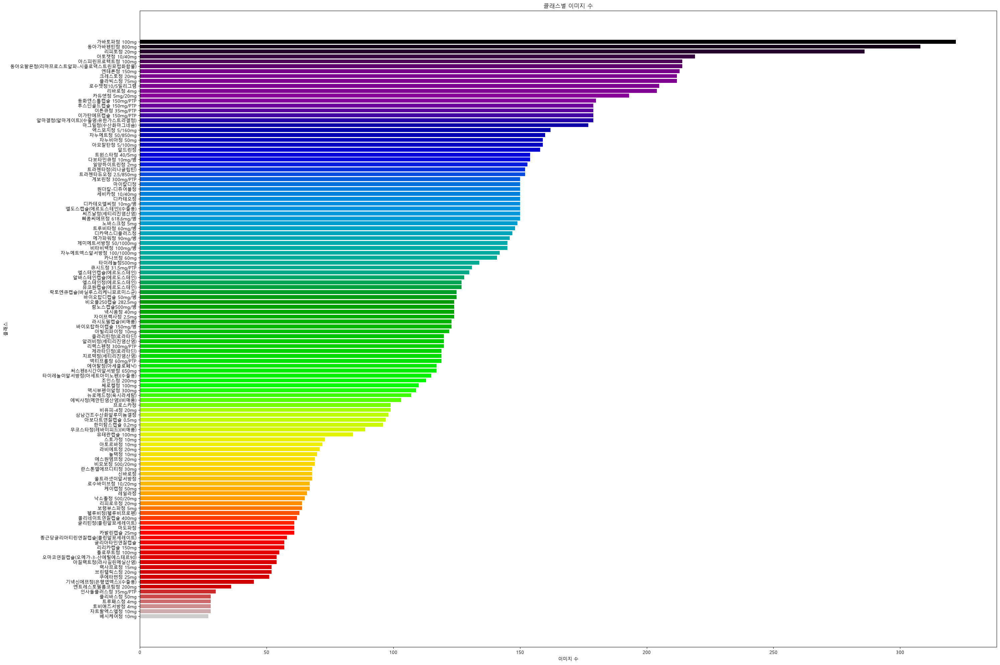

In [11]:
#@title 클래스별 이미지 수
# Windows 한글 폰트 설정 (맑은 고딕)
plt.rcParams['font.family'] = 'Malgun Gothic'

# 마이너스 기호 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(df)))

plt.figure(figsize=(30, 20))

plt.barh(
    df["name"],
    df["image_count"],
    color=colors
)

plt.xlabel("이미지 수")
plt.ylabel("클래스")
plt.title("클래스별 이미지 수")

plt.gca().invert_yaxis()  # df가 내림차순이면 큰 값이 위로 오게 함
plt.tight_layout();
plt.show();

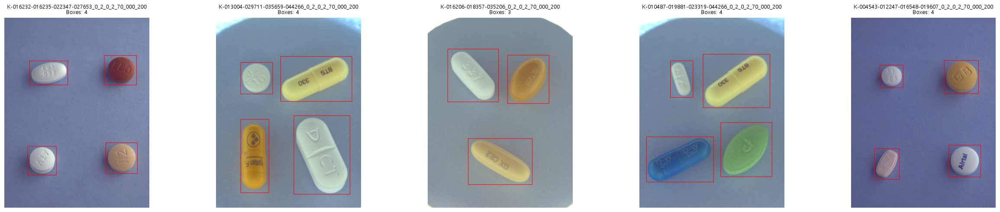

In [12]:
#@title Train 이미지 + Bounding Box 시각화 (XYWH → XYXY 변환 후)

n_samples = min(5, len(image_dir))

sample_paths = np.random.choice(
    image_dir,
    size=n_samples,
    replace=False
)

fig, axes = plt.subplots(
    1,
    n_samples,
    figsize=(5 * n_samples, 5)
)

# 이미지가 1장이어도 반복 가능하게 처리
axes = np.atleast_1d(axes)

for ax, img_path in zip(axes, sample_paths):
    img_stem = os.path.splitext(
        os.path.basename(img_path)
    )[0]

    train_image = cv2.imread(img_path)
    train_image = cv2.cvtColor(
        train_image,
        cv2.COLOR_BGR2RGB
    )

    image_h, image_w = train_image.shape[:2]

    # 여러 annotation JSON을 병합한 record 사용
    record = image_records.get(img_stem)

    if record is None:
        print(
            f"'{img_stem}'에 해당하는 annotation을 "
            "찾지 못했습니다."
        )
        boxes = []
    else:
        boxes = []

        for ann in record["annotations"]:
            # 원본 COCO bbox: [x, y, width, height]
            x, y, bw, bh = ann["bbox"]

            # OpenCV용 XYXY 좌표로 변환
            x1 = int(round(x))
            y1 = int(round(y))
            x2 = int(round(x + bw))
            y2 = int(round(y + bh))

            # 이미지 범위를 벗어나지 않도록 제한
            x1 = max(0, min(x1, image_w - 1))
            y1 = max(0, min(y1, image_h - 1))
            x2 = max(0, min(x2, image_w - 1))
            y2 = max(0, min(y2, image_h - 1))

            if x2 <= x1 or y2 <= y1:
                print(
                    f"잘못된 bbox 제외: "
                    f"{img_stem}, {ann['bbox']}"
                )
                continue

            boxes.append([x1, y1, x2, y2])

            cv2.rectangle(
                train_image,
                (x1, y1),
                (x2, y2),
                (255, 0, 0),
                2
            )

    ax.imshow(train_image)
    ax.set_title(
        f"{img_stem}\nBoxes: {len(boxes)}",
        fontsize=9
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [13]:
#@title 클래스 매핑 검증

expected_labels = set(range(1, num_classes))
mapped_labels = set(label_to_category.keys())

assert mapped_labels == expected_labels, (
    f"label_to_category 불일치: "
    f"누락={expected_labels - mapped_labels}, "
    f"초과={mapped_labels - expected_labels}"
)
assert len(category_to_label) == len(category_id_to_name)
assert num_classes == len(category_to_label) + 1

print(f"실제 약품 클래스 수: {len(category_to_label)}")
print(f"background 포함 모델 클래스 수: {num_classes}")
print(f"label 범위: {min(mapped_labels)} ~ {max(mapped_labels)}")
print("매핑 샘플:")

for label in sorted(mapped_labels)[:5]:
    class_code = label_to_category[label]
    print(
        f"  model label {label:>2} -> "
        f"{class_code} -> "
        f"submission category_id {code_to_submission_category_id[class_code]} -> "
        f"{category_id_to_name[class_code]}"
    )


실제 약품 클래스 수: 118
background 포함 모델 클래스 수: 119
label 범위: 1 ~ 118
매핑 샘플:
  model label  1 -> K-000250 -> submission category_id 250 -> 마그밀정(수산화마그네슘)
  model label  2 -> K-000573 -> submission category_id 573 -> 게보린정 300mg/PTP
  model label  3 -> K-001866 -> submission category_id 1866 -> 알마겔정(알마게이트)(수출명:유한가스트라겔정)
  model label  4 -> K-001900 -> submission category_id 1900 -> 보령부스파정 5mg
  model label  5 -> K-002483 -> submission category_id 2483 -> 뮤테란캡슐 100mg


## STEP 2 : Transform ~ Dataset ~ DataLoader

In [14]:
#@title Transformer
train_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(dtype=torch.float32, scale=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.1,
        hue=0.02,
    ),
])

val_test_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(dtype=torch.float32, scale=True),
])

In [15]:
#@title Pill Dataset 정의
class PillDataset(Dataset):
    def __init__(
        self,
        image_dir,
        image_records,
        stems,
        category_to_label,
        transforms=None
    ):
        self.image_dir = image_dir
        self.image_records = image_records
        self.stems = stems
        self.category_to_label = category_to_label
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]

        # 미리 병합해둔 annotation 정보 가져오기
        record = self.image_records[stem]

        with Image.open(os.path.join(self.image_dir, record["file_name"])) as im:
            image = im.convert("RGB")

        w = record["width"]
        h = record["height"]

        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for ann in record["annotations"]:
            x, y, bw, bh = ann["bbox"]

            boxes.append([x, y, x + bw, y + bh])
            labels.append(
                self.category_to_label[ann["category_id"]]
            )
            areas.append(ann["area"])
            iscrowd.append(ann["iscrowd"])

        image = tv_tensors.Image(image)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        boxes = boxes.reshape(-1, 4) if boxes.numel() else boxes.reshape(0, 4)
        boxes = tv_tensors.BoundingBoxes(
            boxes,
            format="XYXY",
            canvas_size=(h, w)
        )

        target = {
            "boxes": boxes,
            "labels": torch.as_tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor([idx]),
            "area": torch.as_tensor(areas, dtype=torch.float32),
            "iscrowd": torch.as_tensor(iscrowd, dtype=torch.int64),
        }

        if self.transforms:
            image, target = self.transforms(image, target)

        return image, target

In [16]:
#@title Multilabel Stratified Train / Validation Split
from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit

SEED = 42
VAL_RATIO = 0.2
N_CANDIDATES = 200

stems = np.asarray(sorted(image_records.keys()), dtype=object)

# 실제 클래스는 "K-xxxxxx" 문자열
category_ids = np.asarray(
    sorted(category_to_label.keys()),
    dtype=object
)

category_to_col = {
    class_code: col
    for col, class_code in enumerate(category_ids)
}

y = np.zeros(
    (len(stems), len(category_ids)),
    dtype=np.uint8
)

for i, stem in enumerate(stems):
    image_category_ids = {
        ann["category_id"]
        for ann in image_records[stem]["annotations"]
    }

    for class_code in image_category_ids:
        y[i, category_to_col[class_code]] = 1


total_image_counts = y.sum(axis=0)

# 등장 이미지가 1장뿐인 클래스는 train에 고정
singleton_cols = np.flatnonzero(total_image_counts == 1)

if len(singleton_cols) > 0:
    forced_train_mask = y[:, singleton_cols].any(axis=1)
    forced_train_idx = np.flatnonzero(forced_train_mask)
else:
    forced_train_idx = np.array([], dtype=np.int64)

all_idx = np.arange(len(stems))
eligible_idx = np.setdiff1d(all_idx, forced_train_idx)

n_valid = max(1, int(round(len(stems) * VAL_RATIO)))

if len(eligible_idx) <= n_valid:
    raise ValueError(
        "Singleton 클래스 이미지를 train에 고정한 뒤 "
        "validation 후보 이미지가 부족합니다."
    )

min_evaluable_count = int(np.ceil(1 / VAL_RATIO))
evaluable_classes = total_image_counts >= min_evaluable_count

best_result = None

for random_state in range(SEED, SEED + N_CANDIDATES):
    splitter = MultilabelStratifiedShuffleSplit(
        n_splits=1,
        test_size=n_valid,
        random_state=random_state,
    )

    relative_train_idx, relative_valid_idx = next(
        splitter.split(
            np.zeros((len(eligible_idx), 1)),
            y[eligible_idx],
        )
    )

    train_idx = np.concatenate([
        forced_train_idx,
        eligible_idx[relative_train_idx],
    ])
    valid_idx = eligible_idx[relative_valid_idx]

    train_counts = y[train_idx].sum(axis=0)
    valid_counts = y[valid_idx].sum(axis=0)

    missing_train_count = int((train_counts == 0).sum())
    missing_valid_count = int(
        (valid_counts[evaluable_classes] == 0).sum()
    )

    if evaluable_classes.any():
        validation_ratio_error = np.abs(
            valid_counts[evaluable_classes]
            / total_image_counts[evaluable_classes]
            - VAL_RATIO
        ).mean()
    else:
        validation_ratio_error = 0.0

    score = (
        missing_train_count,
        missing_valid_count,
        validation_ratio_error,
    )

    if best_result is None or score < best_result[0]:
        best_result = (
            score,
            train_idx,
            valid_idx,
        )


best_score, train_idx, valid_idx = best_result

train_stems = stems[train_idx].tolist()
valid_stems = stems[valid_idx].tolist()


split_stats = pd.DataFrame({
    "dl_mapping_code": category_ids,
    "category_id": [
        code_to_submission_category_id[class_code]
        for class_code in category_ids
    ],
    "class_name": [
        category_id_to_name[class_code]
        for class_code in category_ids
    ],
    "all_images": total_image_counts,
    "train_images": y[train_idx].sum(axis=0),
    "valid_images": y[valid_idx].sum(axis=0),
})

split_stats = split_stats.sort_values(
    ["all_images", "category_id"]
).reset_index(drop=True)

print(f"전체 이미지: {len(stems)}")
print(f"Train 이미지: {len(train_stems)}")
print(f"Validation 이미지: {len(valid_stems)}")
print(f"Train 강제 배치 이미지: {len(forced_train_idx)}")
print(f"선택된 split score: {best_score}")

display(split_stats)


assert set(train_stems).isdisjoint(valid_stems)
assert len(train_stems) + len(valid_stems) == len(stems)

missing_train = split_stats[
    split_stats["train_images"] == 0
]

missing_valid = split_stats[
    (split_stats["all_images"] >= min_evaluable_count)
    & (split_stats["valid_images"] == 0)
]

if not missing_train.empty:
    display(missing_train)
    raise RuntimeError(
        "Train에 존재하지 않는 클래스가 있습니다."
    )

if not missing_valid.empty:
    display(missing_valid)
    raise RuntimeError(
        f"이미지가 {min_evaluable_count}장 이상인데 "
        "Validation에 없는 클래스가 있습니다."
    )

rare_missing_valid = split_stats[
    split_stats["all_images"].between(
        2,
        min_evaluable_count - 1
    )
    & (split_stats["valid_images"] == 0)
]

if not rare_missing_valid.empty:
    print(
        "\n주의: 표본이 2~4장뿐이라 Validation에 포함되지 않은 "
        "클래스입니다. 학습 표본 보존을 우선한 정상적인 결과입니다."
    )
    display(rare_missing_valid)


전체 이미지: 3730
Train 이미지: 2977
Validation 이미지: 753
Train 강제 배치 이미지: 0
선택된 split score: (0, 0, 0.005495766190750356)


,dl_mapping_code,category_id,class_name,all_images,train_images,valid_images
0,K-020852,20852,베시케어정 10mg,27,22,5
1,K-020259,20259,자트랄엑스엘정 10mg,28,22,6
2,K-024752,24752,토비애즈서방정 4mg,28,22,6
3,K-028424,28424,플리바스정 50mg,28,22,6
4,K-033026,33026,트루패스정 4mg,28,22,6
...,...,...,...,...,...,...
113,K-011220,11220,아스피린프로텍트정 100mg,214,171,43
114,K-035206,35206,아토젯정 10/40mg,219,175,44
115,K-016232,16232,리피토정 20mg,286,229,57
116,K-016551,16551,동아가바펜틴정 800mg,308,250,58


In [17]:
#@title Dataset ~ DataLoader
train_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records, stems=train_stems,
    category_to_label=category_to_label, transforms=train_transformer,
)
valid_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records, stems=valid_stems,
    category_to_label=category_to_label, transforms=val_test_transformer,
)

# lambda를 쓰지 않아 Windows multiprocessing에서도 pickle 오류를 피함
def detection_collate_fn(batch):
    return tuple(zip(*batch))

def make_detection_loader(dataset, batch_size, shuffle):
    kwargs = dict(
        dataset=dataset, batch_size=batch_size, shuffle=shuffle,
        collate_fn=detection_collate_fn, num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
    )
    if NUM_WORKERS > 0:
        kwargs.update(persistent_workers=True, prefetch_factor=2)
    return DataLoader(**kwargs)

train_loader = make_detection_loader(train_dataset, TRAIN_BATCH_SIZE, shuffle=True)
val_loader = make_detection_loader(valid_dataset, EVAL_BATCH_SIZE, shuffle=False)

## STEP 3 : Modelling

### Model & Optimizer

### mAP method

### Train - Validation Loop

### mAP & Loss Visualization

In [18]:
#@title RetinaNet ResNet50 FPN v2

model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
    weights=RetinaNet_ResNet50_FPN_V2_Weights.DEFAULT,
    min_size=MODEL_MIN_SIZE,
    max_size=MODEL_MAX_SIZE,
    detections_per_img=20,
)

in_channels = model.backbone.out_channels
num_anchors = (
    model.anchor_generator
    .num_anchors_per_location()[0]
)

# pretrained 91-class head를 현재 데이터 클래스 수에 맞게 교체
model.head.classification_head = RetinaNetClassificationHead(
    in_channels=in_channels,
    num_anchors=num_anchors,
    num_classes=num_classes,
    norm_layer=partial(torch.nn.GroupNorm, 32),
)

model = model.to(device)

In [19]:
#@title Define Optimizer & Scheduler
optimizer = torch.optim.SGD(
    model.parameters(),
    lr=LEARNING_RATE,
    momentum=MOMENTUM,
    weight_decay=WEIGHT_DECAY,
)

lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=SCHEDULER_FACTOR,
    patience=SCHEDULER_PATIENCE,
)

In [20]:
#@title mAP 계산 함수 (IoU threshold 0.75~0.95)
iou_thresholds = [0.75, 0.80, 0.85, 0.90, 0.95]

def evaluate_map(model, data_loader, device):
    was_training = model.training
    model.eval()
    metric = MeanAveragePrecision(iou_type="bbox", iou_thresholds=iou_thresholds)

    # evaluation도 AMP를 사용하면 validation 시간이 크게 줄어듭니다.
    with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
        for images, targets in tqdm(data_loader, desc="Evaluating"):
            images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
            preds = model(images)

            preds_cpu = [
                {
                    "boxes": p["boxes"].float().cpu(),
                    "scores": p["scores"].float().cpu(),
                    "labels": p["labels"].cpu(),
                }
                for p in preds
            ]
            targets_cpu = [{"boxes": t["boxes"].cpu(), "labels": t["labels"].cpu()} for t in targets]

            metric.update(preds_cpu, targets_cpu)

    result = metric.compute()
    if was_training:
        model.train()
    return result

In [21]:
#@title W&B 실험 시작

run = wandb.init(
    entity="jaedong0817-",
    project="beginner-team-project",
    name=EXPERIMENT_NAME,
    job_type="train",
    config={
        "model": "RetinaNet_ResNet50_FPN_V2",
        "num_epochs": NUM_EPOCHS,

        "learning_rate": LEARNING_RATE,
        "momentum": MOMENTUM,
        "weight_decay": WEIGHT_DECAY,

        "train_batch_size": TRAIN_BATCH_SIZE,
        "eval_batch_size": EVAL_BATCH_SIZE,

        "model_min_size": MODEL_MIN_SIZE,
        "model_max_size": MODEL_MAX_SIZE,

        "scheduler_factor": SCHEDULER_FACTOR,
        "scheduler_patience": SCHEDULER_PATIENCE,

        "num_classes": num_classes,
        "iou_thresholds": iou_thresholds
    }
)

#run.id는 W&B가 각 실험에 자동으로 부여하는 고유 ID
CHECKPOINT_PATH = (
    f"best_model_retinanet_{run.id}.pth"
)

In [22]:
import wandb

api = wandb.Api()

projects = list(api.projects(entity="jaedong0817-"))
for p in projects:
    print("-", p.name)

- beginner-team-project


In [23]:
import wandb

api = wandb.Api()

print("현재 로그인 계정:", api.viewer)

현재 로그인 계정: <User yiydggif@gmail.com>


In [25]:
num_epochs = NUM_EPOCHS
best_map = float("-inf")  # mAP가 0이어도 첫 checkpoint는 저장
train_loss_hist = []
val_map_hist = []
val_map_75_hist = []
val_epoch_hist = []

scaler = torch.cuda.amp.GradScaler(enabled=AMP_ENABLED)

for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0.0

    for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1} Training"):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        targets = [
            {k: v.to(device, non_blocking=PIN_MEMORY) for k, v in t.items()}
            for t in targets
        ]

        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=AMP_ENABLED):
            loss_dict = model(images, targets)
            losses = sum(loss_dict.values())

        scaler.scale(losses).backward()
        scaler.step(optimizer)
        scaler.update()

        total_train_loss += losses.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_hist.append(avg_train_loss)

    print(f"Epoch {epoch + 1}/{num_epochs} | Train Loss: {avg_train_loss:.4f}")

    val_map = evaluate_map(model, val_loader, device)
    current_map = val_map["map"].item()
    current_map_75 = val_map["map_75"].item()
    lr_scheduler.step(current_map)

    val_epoch_hist.append(epoch + 1)
    val_map_hist.append(current_map)
    val_map_75_hist.append(current_map_75)
    print(
        f"Epoch {epoch + 1}/{num_epochs} | "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"mAP[.75:.95]: {current_map:.4f} | "
        f"mAP@75: {current_map_75:.4f}"
    )

    # W&B에 이번 epoch 결과 기록
    run.log({
        "epoch": epoch + 1,
        "train/loss": avg_train_loss,
        "validation/mAP_75_95": current_map,
        "validation/mAP_75": current_map_75,
        "learning_rate": optimizer.param_groups[0]["lr"]
    })

    if current_map > best_map:
        best_map = current_map
        torch.save({
            "epoch": epoch + 1,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": lr_scheduler.state_dict(),
            "best_map": best_map,
        }, CHECKPOINT_PATH)
        print(f"  → New best model saved (mAP: {best_map:.4f})")

Epoch 1 Training:   0%|          | 0/373 [00:00<?, ?it/s]

Epoch 1 Training: 100%|██████████| 373/373 [11:26<00:00,  1.84s/it]


Epoch 1/100 | Train Loss: 0.2432


Evaluating: 100%|██████████| 95/95 [00:57<00:00,  1.64it/s]


Epoch 1/100 | Train Loss: 0.2432 | mAP[.75:.95]: 0.8536 | mAP@75: 0.9308
  → New best model saved (mAP: 0.8536)


Epoch 2 Training: 100%|██████████| 373/373 [11:15<00:00,  1.81s/it]


Epoch 2/100 | Train Loss: 0.1690


Evaluating: 100%|██████████| 95/95 [00:58<00:00,  1.63it/s]


Epoch 2/100 | Train Loss: 0.1690 | mAP[.75:.95]: 0.9023 | mAP@75: 0.9633
  → New best model saved (mAP: 0.9023)


Epoch 3 Training: 100%|██████████| 373/373 [11:27<00:00,  1.84s/it]


Epoch 3/100 | Train Loss: 0.1343


Evaluating: 100%|██████████| 95/95 [00:57<00:00,  1.65it/s]


Epoch 3/100 | Train Loss: 0.1343 | mAP[.75:.95]: 0.9127 | mAP@75: 0.9709
  → New best model saved (mAP: 0.9127)


Epoch 4 Training: 100%|██████████| 373/373 [11:11<00:00,  1.80s/it]


Epoch 4/100 | Train Loss: 0.1160


Evaluating: 100%|██████████| 95/95 [00:58<00:00,  1.64it/s]


Epoch 4/100 | Train Loss: 0.1160 | mAP[.75:.95]: 0.8994 | mAP@75: 0.9766


Epoch 5 Training: 100%|██████████| 373/373 [11:49<00:00,  1.90s/it]


Epoch 5/100 | Train Loss: 0.1048


Evaluating: 100%|██████████| 95/95 [01:01<00:00,  1.55it/s]


Epoch 5/100 | Train Loss: 0.1048 | mAP[.75:.95]: 0.9346 | mAP@75: 0.9777
  → New best model saved (mAP: 0.9346)


Epoch 6 Training: 100%|██████████| 373/373 [11:19<00:00,  1.82s/it]


Epoch 6/100 | Train Loss: 0.0986


Evaluating: 100%|██████████| 95/95 [00:54<00:00,  1.75it/s]


Epoch 6/100 | Train Loss: 0.0986 | mAP[.75:.95]: 0.9260 | mAP@75: 0.9786


Epoch 7 Training: 100%|██████████| 373/373 [11:22<00:00,  1.83s/it]


Epoch 7/100 | Train Loss: 0.0927


Evaluating: 100%|██████████| 95/95 [01:01<00:00,  1.54it/s]


Epoch 7/100 | Train Loss: 0.0927 | mAP[.75:.95]: 0.9413 | mAP@75: 0.9790
  → New best model saved (mAP: 0.9413)


Epoch 8 Training: 100%|██████████| 373/373 [11:08<00:00,  1.79s/it]


Epoch 8/100 | Train Loss: 0.0873


Evaluating: 100%|██████████| 95/95 [00:57<00:00,  1.65it/s]


Epoch 8/100 | Train Loss: 0.0873 | mAP[.75:.95]: 0.9476 | mAP@75: 0.9792
  → New best model saved (mAP: 0.9476)


Epoch 9 Training: 100%|██████████| 373/373 [11:14<00:00,  1.81s/it]


Epoch 9/100 | Train Loss: 0.0826


Evaluating: 100%|██████████| 95/95 [01:07<00:00,  1.41it/s]


Epoch 9/100 | Train Loss: 0.0826 | mAP[.75:.95]: 0.9478 | mAP@75: 0.9794
  → New best model saved (mAP: 0.9478)


Epoch 10 Training: 100%|██████████| 373/373 [11:05<00:00,  1.78s/it]


Epoch 10/100 | Train Loss: 0.0821


Evaluating: 100%|██████████| 95/95 [00:53<00:00,  1.78it/s]


Epoch 10/100 | Train Loss: 0.0821 | mAP[.75:.95]: 0.9471 | mAP@75: 0.9798


Epoch 11 Training: 100%|██████████| 373/373 [11:17<00:00,  1.82s/it]


Epoch 11/100 | Train Loss: 0.0791


Evaluating: 100%|██████████| 95/95 [00:53<00:00,  1.78it/s]


Epoch 11/100 | Train Loss: 0.0791 | mAP[.75:.95]: 0.9314 | mAP@75: 0.9790


Epoch 12 Training: 100%|██████████| 373/373 [11:04<00:00,  1.78s/it]


Epoch 12/100 | Train Loss: 0.0752


Evaluating: 100%|██████████| 95/95 [00:53<00:00,  1.78it/s]


Epoch 12/100 | Train Loss: 0.0752 | mAP[.75:.95]: 0.9491 | mAP@75: 0.9792
  → New best model saved (mAP: 0.9491)


Epoch 13 Training: 100%|██████████| 373/373 [11:10<00:00,  1.80s/it]


Epoch 13/100 | Train Loss: 0.0718


Evaluating: 100%|██████████| 95/95 [00:53<00:00,  1.76it/s]


Epoch 13/100 | Train Loss: 0.0718 | mAP[.75:.95]: 0.9489 | mAP@75: 0.9792


Epoch 14 Training: 100%|██████████| 373/373 [11:09<00:00,  1.79s/it]


Epoch 14/100 | Train Loss: 0.0708


Evaluating: 100%|██████████| 95/95 [00:52<00:00,  1.79it/s]


Epoch 14/100 | Train Loss: 0.0708 | mAP[.75:.95]: 0.9515 | mAP@75: 0.9812
  → New best model saved (mAP: 0.9515)


Epoch 15 Training: 100%|██████████| 373/373 [11:15<00:00,  1.81s/it]


Epoch 15/100 | Train Loss: 0.0698


Evaluating: 100%|██████████| 95/95 [00:58<00:00,  1.63it/s]


Epoch 15/100 | Train Loss: 0.0698 | mAP[.75:.95]: 0.9513 | mAP@75: 0.9791


Epoch 16 Training: 100%|██████████| 373/373 [11:11<00:00,  1.80s/it]


Epoch 16/100 | Train Loss: 0.0672


Evaluating: 100%|██████████| 95/95 [00:57<00:00,  1.64it/s]


Epoch 16/100 | Train Loss: 0.0672 | mAP[.75:.95]: 0.9543 | mAP@75: 0.9805
  → New best model saved (mAP: 0.9543)


Epoch 17 Training: 100%|██████████| 373/373 [11:56<00:00,  1.92s/it]


Epoch 17/100 | Train Loss: 0.0664


Evaluating: 100%|██████████| 95/95 [00:58<00:00,  1.63it/s]


Epoch 17/100 | Train Loss: 0.0664 | mAP[.75:.95]: 0.9533 | mAP@75: 0.9791


Epoch 18 Training: 100%|██████████| 373/373 [11:09<00:00,  1.79s/it]


Epoch 18/100 | Train Loss: 0.0658


Evaluating: 100%|██████████| 95/95 [00:57<00:00,  1.64it/s]


Epoch 18/100 | Train Loss: 0.0658 | mAP[.75:.95]: 0.9548 | mAP@75: 0.9801
  → New best model saved (mAP: 0.9548)


Epoch 19 Training: 100%|██████████| 373/373 [11:43<00:00,  1.89s/it]


Epoch 19/100 | Train Loss: 0.0713


Evaluating: 100%|██████████| 95/95 [00:54<00:00,  1.75it/s]


Epoch 19/100 | Train Loss: 0.0713 | mAP[.75:.95]: 0.9540 | mAP@75: 0.9792


Epoch 20 Training: 100%|██████████| 373/373 [11:08<00:00,  1.79s/it]


Epoch 20/100 | Train Loss: 0.0636


Evaluating: 100%|██████████| 95/95 [00:57<00:00,  1.64it/s]


Epoch 20/100 | Train Loss: 0.0636 | mAP[.75:.95]: 0.9533 | mAP@75: 0.9799


Epoch 21 Training: 100%|██████████| 373/373 [11:31<00:00,  1.85s/it]


Epoch 21/100 | Train Loss: 0.0626


Evaluating: 100%|██████████| 95/95 [01:12<00:00,  1.31it/s]


Epoch 21/100 | Train Loss: 0.0626 | mAP[.75:.95]: 0.9533 | mAP@75: 0.9796


Epoch 22 Training:   1%|          | 3/373 [00:08<17:11,  2.79s/it]


KeyboardInterrupt: 

In [26]:
#@title 최고 모델을 W&B Artifact로 업로드

model_artifact = wandb.Artifact(
    name=f"retinanet-{run.id}",
    type="model",
    description=f"Best checkpoint from {EXPERIMENT_NAME}",
    metadata={
        "experiment_name": EXPERIMENT_NAME,
        "run_id": run.id,
        "best_map_75_95": best_map,
        "learning_rate": LEARNING_RATE,
        "momentum": MOMENTUM,
        "weight_decay": WEIGHT_DECAY,
        "train_batch_size": TRAIN_BATCH_SIZE,
        "model_min_size": MODEL_MIN_SIZE,
        "model_max_size": MODEL_MAX_SIZE
    }
)

model_artifact.add_file(CHECKPOINT_PATH)

run.log_artifact(
    model_artifact,
    aliases=["best"]
)

run.finish()

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train/loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation/mAP_75,▁▇▇███████████████████
validation/mAP_75_95,▁▆▇▇▇█▇████▇██████████
epoch,21
learning_rate,0.003
train/loss,0.06257
validation/mAP_75,0.97957
validation/mAP_75_95,0.95334


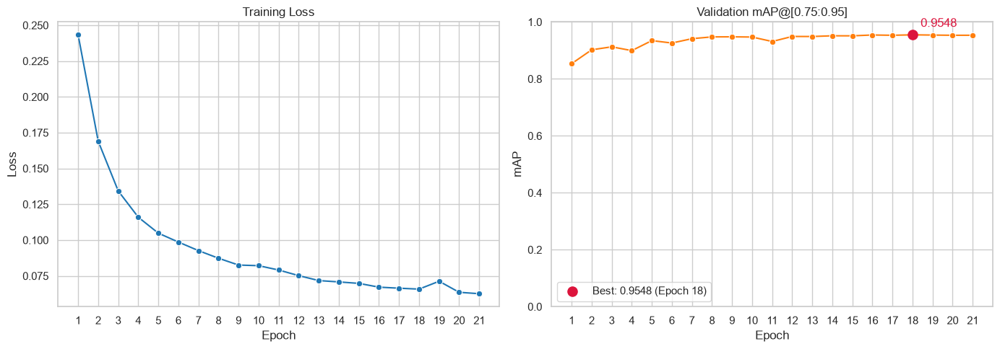

In [27]:
sns.set_theme(style="whitegrid", context="notebook")

epochs = range(1, len(train_loss_hist) + 1)
best_idx = max(range(len(val_map_hist)), key=val_map_hist.__getitem__)
best_epoch = val_epoch_hist[best_idx]
best_score = val_map_hist[best_idx]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Training Loss
sns.lineplot(
    x=list(epochs),
    y=train_loss_hist,
    marker="o",
    color="tab:blue",
    ax=axes[0],
)
axes[0].set_title("Training Loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].set_xticks(list(epochs))

# Validation mAP@[0.75:0.95]
sns.lineplot(
    x=val_epoch_hist,
    y=val_map_hist,
    marker="o",
    color="tab:orange",
    ax=axes[1],
)
axes[1].scatter(
    best_epoch,
    best_score,
    color="crimson",
    s=90,
    zorder=3,
    label=f"Best: {best_score:.4f} (Epoch {best_epoch})",
)
axes[1].annotate(
    f"{best_score:.4f}",
    xy=(best_epoch, best_score),
    xytext=(8, 8),
    textcoords="offset points",
    color="crimson",
)
axes[1].set_title("Validation mAP@[0.75:0.95]")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("mAP")
axes[1].set_ylim(0, 1)
axes[1].set_xticks(val_epoch_hist)
axes[1].legend()

plt.tight_layout()
plt.show()

## STEP 4 : Test

### Test Class 정의

### Visualization Method & Visualization Loop

### Submission CSV 제작 함수

In [28]:
#@title Test 이미지 경로 설정 및 랜덤 샘플링
test_image_dir = glob.glob(os.path.join(path, "test_images", "*.png"))
print(f"Test 이미지 수: {len(test_image_dir)}")

random.seed(42)
test_sample_paths = random.sample(test_image_dir, min(20, len(test_image_dir)))
test_sample_stems = [os.path.splitext(os.path.basename(p))[0] for p in test_sample_paths]

Test 이미지 수: 842


In [29]:
class TestDataset(Dataset):
    def __init__(self, image_dir, stems, transforms):
        self.image_dir = image_dir
        self.stems = stems
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]

        image = Image.open(
            os.path.join(self.image_dir, f"{stem}.png")
        ).convert("RGB")

        orig_w, orig_h = image.size
        image = tv_tensors.Image(image)

        if self.transforms:
            image = self.transforms(image)

        return image, stem, orig_w, orig_h


test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=test_sample_stems,
    transforms=val_test_transformer,
)

test_loader = make_detection_loader(
    test_dataset, batch_size=EVAL_BATCH_SIZE, shuffle=False
)

In [30]:
#@title Define method : visualize_prediction
def visualize_prediction(image, prediction, classes, score_thresh=0.5):
    """
    image (torch.Tensor): 추론에 사용된 이미지 (C, H, W).
    prediction (dict): boxes, labels, scores 포함.
    classes (list): index -> 약 이름 매핑 리스트 (0번 = background).
    """
    image = image.permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(image)

    for box, label, score in zip(prediction["boxes"], prediction["labels"], prediction["scores"]):
        if score > score_thresh:
            x_min, y_min, x_max, y_max = box.tolist()
            width, height = x_max - x_min, y_max - y_min

            rect = patches.Rectangle(
                (x_min, y_min), width, height,
                linewidth=2, edgecolor="red", facecolor="none"
            )
            ax.add_patch(rect)
            ax.text(
                x_min, max(y_min - 5, 0),
                f"{classes[label.item()]} ({score:.2f})",
                color="white", fontsize=9,
                bbox=dict(facecolor="red", alpha=0.6, pad=1)
            )

    ax.axis("off")
    plt.show()

Test Inference:   0%|          | 0/3 [00:00<?, ?it/s]

파일명: 68


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53944 (\N{HANGUL SYLLABLE TEU}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51232 (\N{HANGUL SYLLABLE JEN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53440 (\N{HANGUL SYLLABLE TA}) missing from font(s) Arial.
  fig.canvas

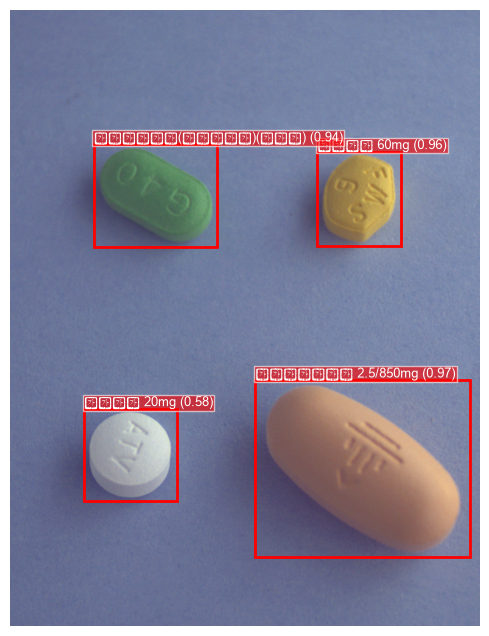

파일명: 1174


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49464 (\N{HANGUL SYLLABLE SE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48708 (\N{HANGUL SYLLABLE BI}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48148 (\N{HANGUL SYLLABLE BA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from font(s) Arial.
  fig.canvas.p

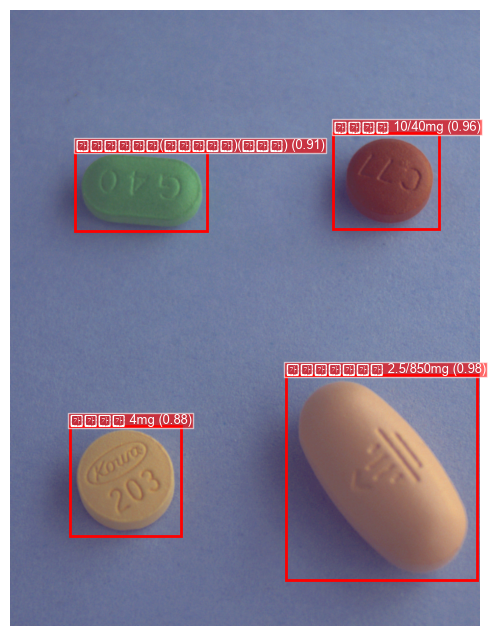

파일명: 1029


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48709 (\N{HANGUL SYLLABLE BIG}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47700 (\N{HANGUL SYLLABLE ME}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47564 (\N{HANGUL SYLLABLE MAN}) missing from font(s) Arial.
  fig.canvas

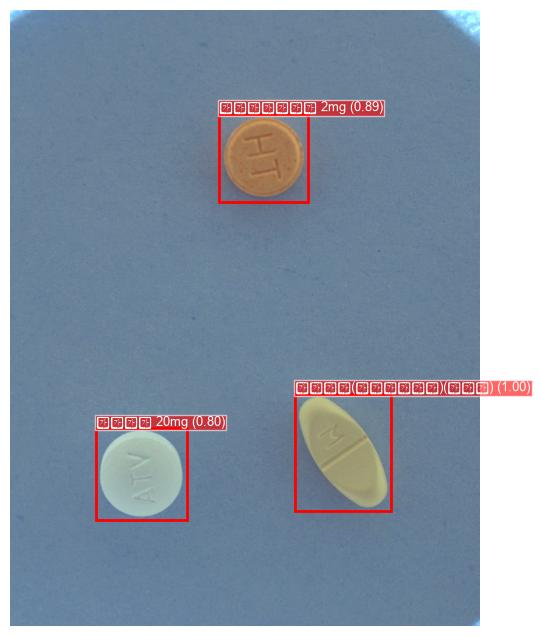

파일명: 875


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45572 (\N{HANGUL SYLLABLE NU}) missing from font(s) Arial.
  fig.canvas.p

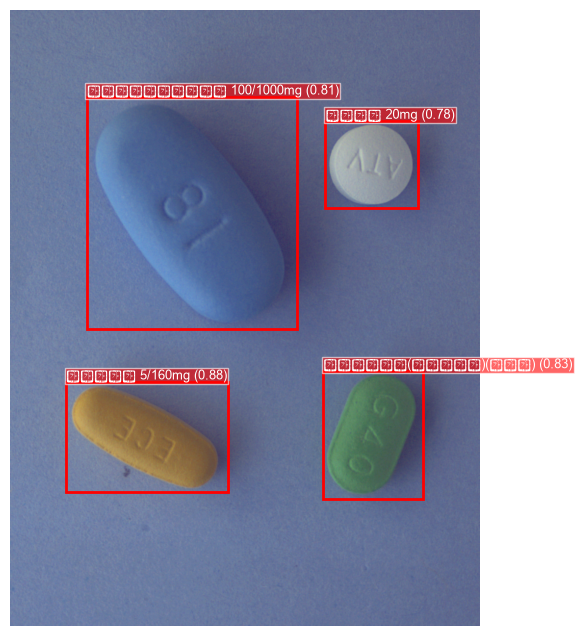

파일명: 1449


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50052 (\N{HANGUL SYLLABLE SSE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53000 (\N{HANGUL SYLLABLE KEL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47112 (\N{HANGUL SYLLABLE RE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47924 (\N{HANGUL SYLLABLE MU}) missing from font(s) Arial.
  fig.canvas

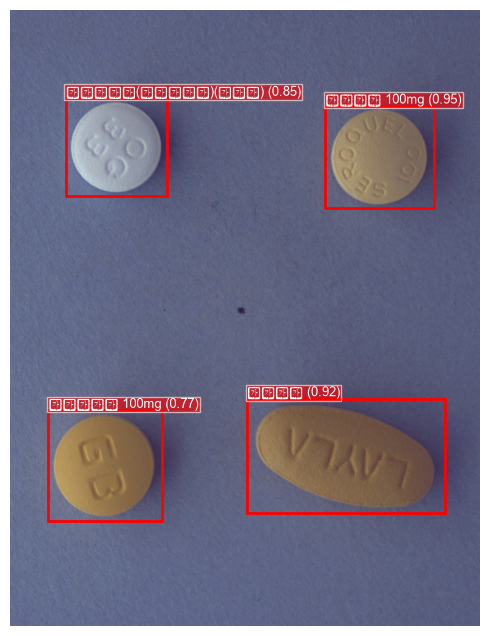

파일명: 1393


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53356 (\N{HANGUL SYLLABLE KEU}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50500 (\N{HANGUL SYLLABLE A}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


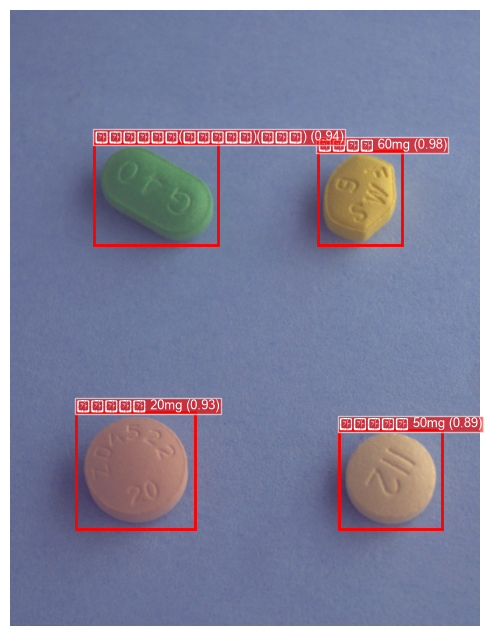

파일명: 1358


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47113 (\N{HANGUL SYLLABLE REG}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51312 (\N{HANGUL SYLLABLE JO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51064 (\N{HANGUL SYLLABLE IN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


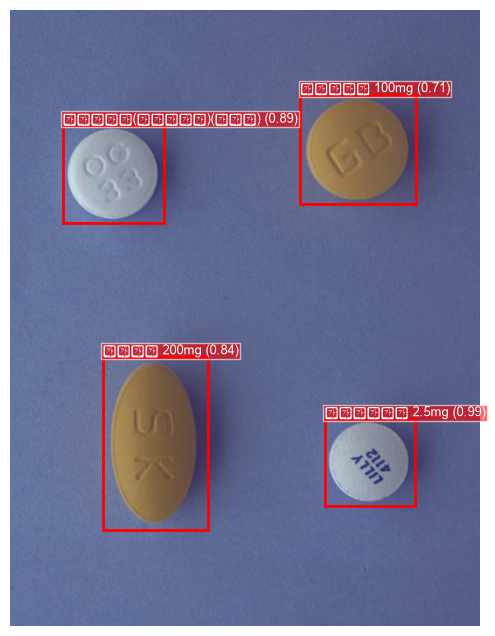

파일명: 1214


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48036 (\N{HANGUL SYLLABLE MYU}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53580 (\N{HANGUL SYLLABLE TE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 46976 (\N{HANGUL SYLLABLE RAN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 52897 (\N{HANGUL SYLLABLE KAEB}) missing from font(s) Arial.
  fig.canv

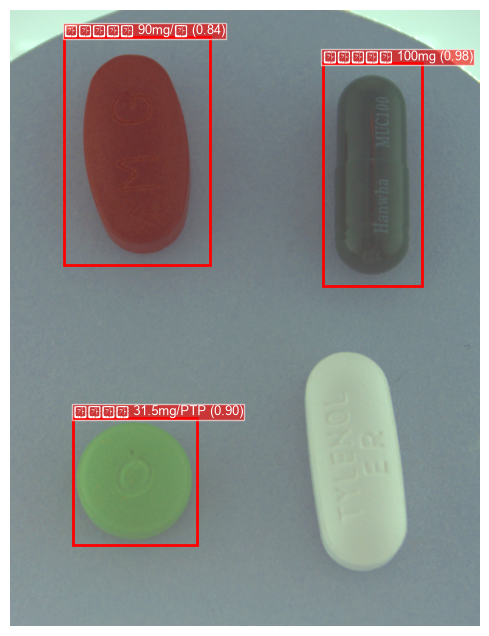

Test Inference:  33%|███▎      | 1/3 [00:02<00:05,  2.92s/it]

파일명: 868


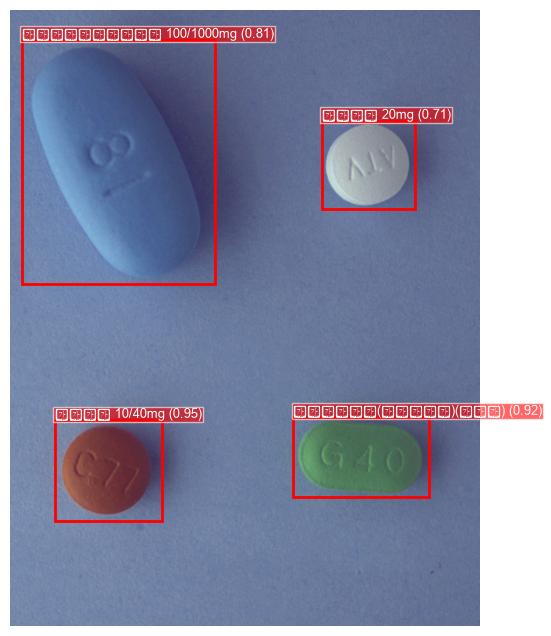

파일명: 1159


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44540 (\N{HANGUL SYLLABLE GEUN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45817 (\N{HANGUL SYLLABLE DANG}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44544 (\N{HANGUL SYLLABLE GEUL}) missing from font(s) Arial.
  fig.

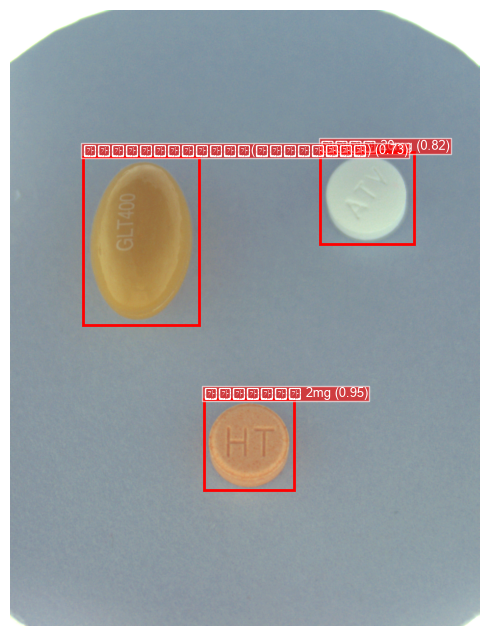

파일명: 742


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49296 (\N{HANGUL SYLLABLE BBI}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53092 (\N{HANGUL SYLLABLE KOM}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50472 (\N{HANGUL SYLLABLE SSI}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45440 (\N{HANGUL SYLLABLE NOL}) missing from font(s) Arial.
  fig.canv

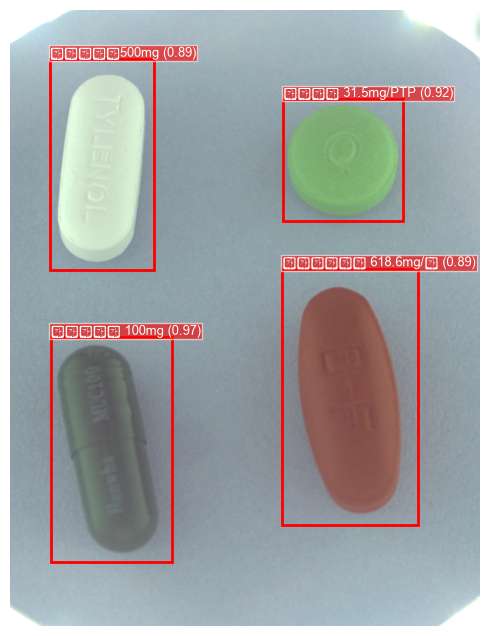

파일명: 874


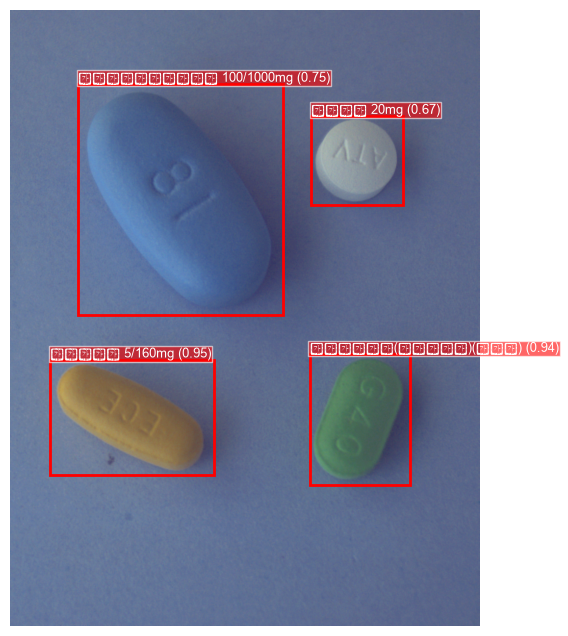

파일명: 546


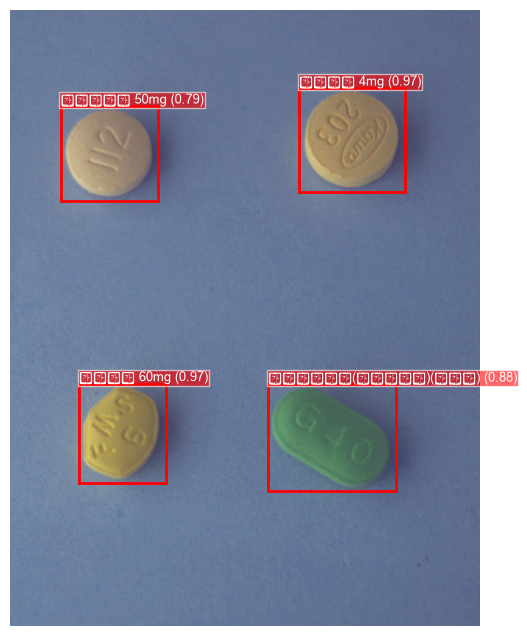

파일명: 1140


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51228 (\N{HANGUL SYLLABLE JE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54540 (\N{HANGUL SYLLABLE PEUL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


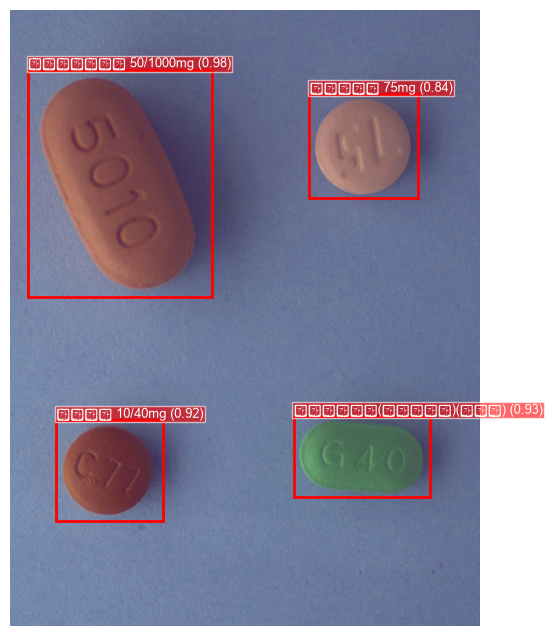

파일명: 612


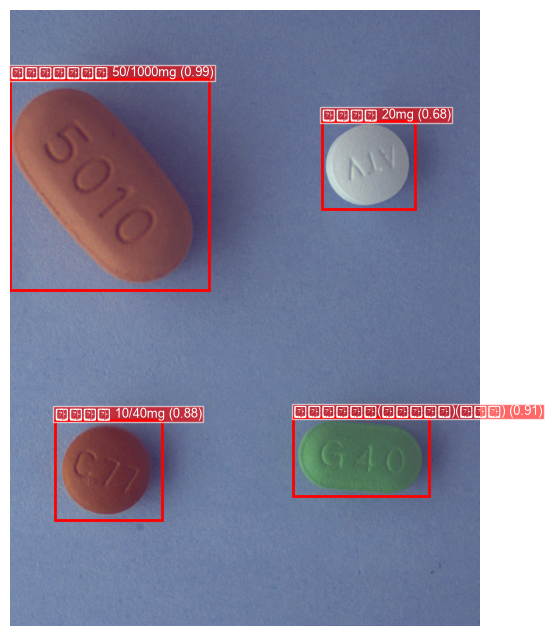

파일명: 346


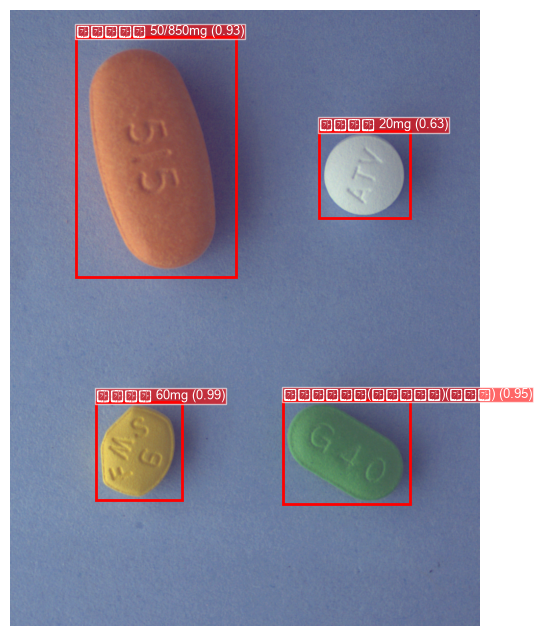

Test Inference:  67%|██████▋   | 2/3 [00:05<00:02,  2.88s/it]

파일명: 1044


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51247 (\N{HANGUL SYLLABLE JES}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


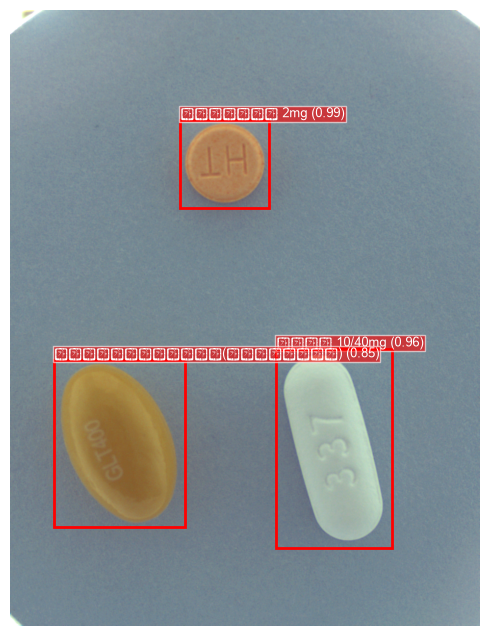

파일명: 1041


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47549 (\N{HANGUL SYLLABLE RIB}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51096 (\N{HANGUL SYLLABLE JAL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53444 (\N{HANGUL SYLLABLE TAN}) missing from font(s) Arial.
  fig.canva

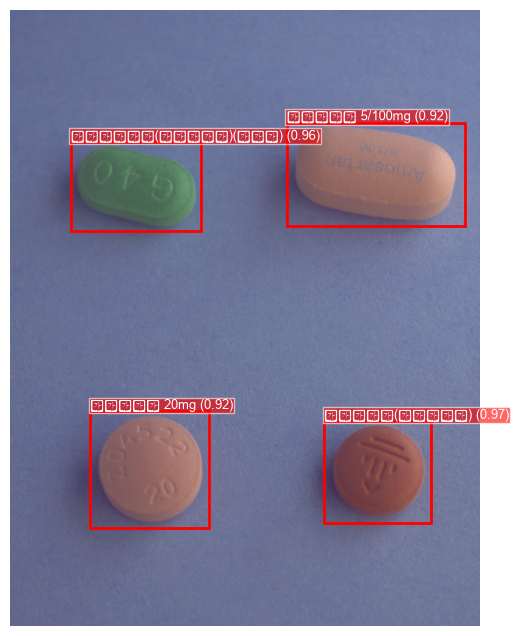

파일명: 1149


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


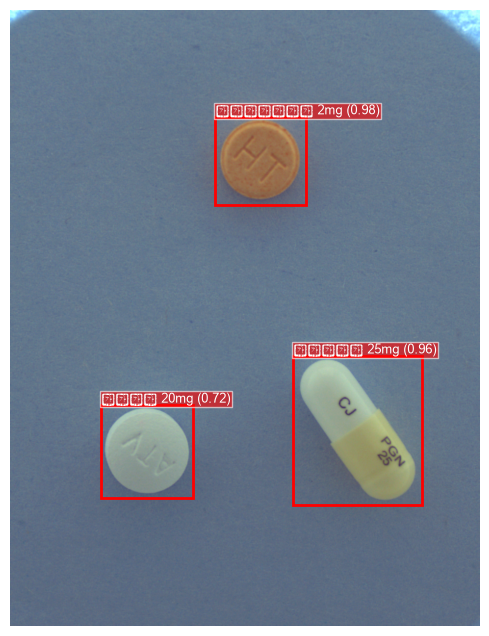

파일명: 1350


c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44600 (\N{HANGUL SYLLABLE GIL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50864 (\N{HANGUL SYLLABLE U}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


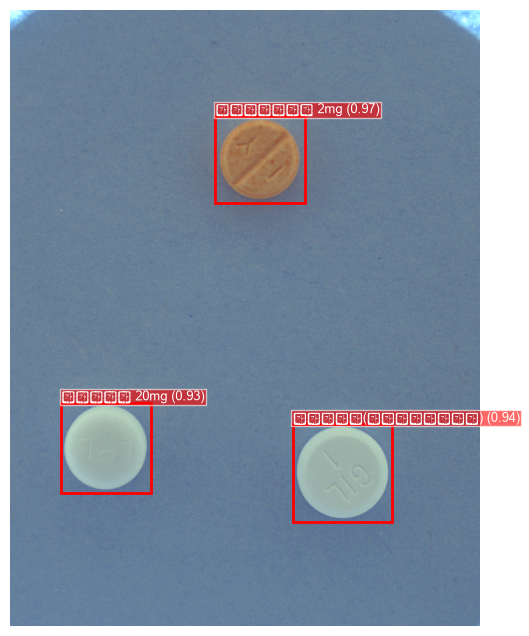

Test Inference: 100%|██████████| 3/3 [00:10<00:00,  3.39s/it]


In [31]:
#@title Test 이미지 20장 추론 및 시각화
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
    for images, stems, orig_ws, orig_hs in tqdm(test_loader, desc="Test Inference"):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        predictions = model(images)

        for img, pred, stem, orig_w, orig_h in zip(images, predictions, stems, orig_ws, orig_hs):
            print(f"파일명: {stem}")
            visualize_prediction(img.cpu(), pred, classes)

In [32]:
#@title Submission CSV 생성
model_name = "retinanet_resnet50_fpn_v2"

checkpoint = torch.load(
    CHECKPOINT_PATH,
    map_location=device,
)
model.load_state_dict(
    checkpoint["model_state_dict"]
)

model.to(device)
model.eval()

all_test_paths = sorted(glob.glob(os.path.join(path, "test_images", "*.png")))
all_test_stems = [
    os.path.splitext(os.path.basename(p))[0]
    for p in all_test_paths
]

submission_test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=all_test_stems,
    transforms=val_test_transformer
)

submission_test_loader = make_detection_loader(
    submission_test_dataset, batch_size=EVAL_BATCH_SIZE, shuffle=False
)

rows = []
annotation_id = 1
score_thresh = 0.3 # 최적 파라미터

with torch.inference_mode(), torch.cuda.amp.autocast(enabled=AMP_ENABLED):
    for images, stems, orig_ws, orig_hs in tqdm(
        submission_test_loader,
        desc="Submission Inference"
    ):
        images = [img.to(device, non_blocking=PIN_MEMORY) for img in images]
        predictions = model(images)

        for pred, stem, orig_w, orig_h in zip(
            predictions, stems, orig_ws, orig_hs
        ):
            image_id = int(stem)

            boxes = pred["boxes"].cpu()
            labels = pred["labels"].cpu()
            scores = pred["scores"].cpu()

            keep = scores >= score_thresh
            boxes = boxes[keep]
            labels = labels[keep]
            scores = scores[keep]

            for box, label, score in zip(boxes, labels, scores):
                x_min, y_min, x_max, y_max = box.tolist()

                x_min = max(0, min(x_min, orig_w))
                x_max = max(0, min(x_max, orig_w))
                y_min = max(0, min(y_min, orig_h))
                y_max = max(0, min(y_max, orig_h))

                bbox_w = x_max - x_min
                bbox_h = y_max - y_min

                if bbox_w <= 0 or bbox_h <= 0:
                    continue

                rows.append([
                    annotation_id,
                    image_id,
                    code_to_submission_category_id[label_to_category[int(label.item())]],
                    round(x_min, 2),
                    round(y_min, 2),
                    round(bbox_w, 2),
                    round(bbox_h, 2),
                    round(score.item(), 4),
                ])
                annotation_id += 1

submission_filename = f"submission_{model_name}.csv"

with open(submission_filename, "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow([
        "annotation_id", "image_id", "category_id",
        "bbox_x", "bbox_y", "bbox_w", "bbox_h", "score"
    ])
    writer.writerows(rows)

print(f"총 {len(rows)}개 예측 저장 완료 → {submission_filename}")

Submission Inference: 100%|██████████| 106/106 [01:18<00:00,  1.35it/s]

총 3404개 예측 저장 완료 → submission_retinanet_resnet50_fpn_v2.csv
